# PREDICTION OF AGRICULTURE PRODUCTION

## Dataset from 'data.cov.in' consists of 246091 rows and 7 columns

### Flow of project

#### 1. IMPORTING DATASET
#### 2. EDA ( EXPLORATORY DATA ANALYSIS )
#### 3. ANALYSIS OF DATASET
####  ~3.1. PLOTTING TOP 5 STATES WITH LARGE AREA
####  ~3.2. PLOTING TOP 5 DISTRICTS WITH LARGE AREA
####  ~3.3. PLOTTING TOP 5 CROP WITH HIGHEST PRODUCTIONS (1997 - 2015)
####  ~3.4. TOP 5 CROPS PRODUCTION IN YEARS ( COCONUT, SUGARCANE, RICE, WHEAT, POTATO )
#### 4. BUILDING MODEL ( LINEAR REGRESSION USING SKLEARN , OLS )
#### 5. PREDICTING 
#### 6. MODEL EVAUALTION


In [96]:
# import packages
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None
import plotly
import plotly.express as px
import plotly.graph_objects as go

In [3]:
data = pd.read_csv('apy.csv')
data.head()

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0


In [4]:
data.tail()

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
246086,West Bengal,PURULIA,2014,Summer,Rice,306.0,801.0
246087,West Bengal,PURULIA,2014,Summer,Sesamum,627.0,463.0
246088,West Bengal,PURULIA,2014,Whole Year,Sugarcane,324.0,16250.0
246089,West Bengal,PURULIA,2014,Winter,Rice,279151.0,597899.0
246090,West Bengal,PURULIA,2014,Winter,Sesamum,175.0,88.0


In [5]:
data['Crop_Year'].max()

2015

In [6]:
data['Crop_Year'].min()

1997

In [7]:
data.columns

Index(['State_Name', 'District_Name', 'Crop_Year', 'Season', 'Crop', 'Area',
       'Production'],
      dtype='object')

In [8]:
data.shape

(246091, 7)

In [ ]:
'''

Here we could see missing values in Production column so we can do 2 things 

1. remove the missing rows from the dataset
2. fill the missing rows using linear regression
3. fill with mean/median 

As the missing values are from Production which is our Y we can not use 2. and 3. points,
that can deviate the model 


'''

In [9]:
data.isna().sum()

State_Name          0
District_Name       0
Crop_Year           0
Season              0
Crop                0
Area                0
Production       3730
dtype: int64

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246091 entries, 0 to 246090
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   State_Name     246091 non-null  object 
 1   District_Name  246091 non-null  object 
 2   Crop_Year      246091 non-null  int64  
 3   Season         246091 non-null  object 
 4   Crop           246091 non-null  object 
 5   Area           246091 non-null  float64
 6   Production     242361 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 13.1+ MB


In [11]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Crop_Year,246091.0,2005.643018,4.952164e+00,1997.00,2002.0,2006.0,2010.0,2.015000e+03
Area,246091.0,12002.820864,5.052340e+04,0.04,80.0,582.0,4392.0,8.580100e+06
Production,242361.0,582503.442251,1.706581e+07,0.00,88.0,729.0,7023.0,1.250800e+09


<AxesSubplot:>

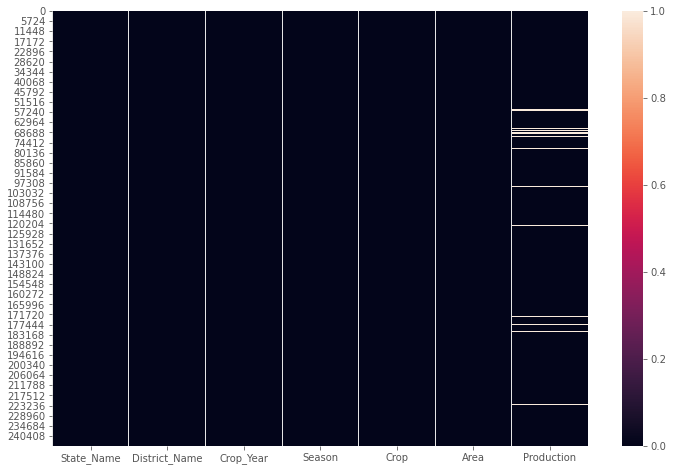

In [12]:
cols = data.columns[:] 
 # specify the colours - yellow is missing. blue is not missing.
sns.heatmap(data[cols].isnull())

In [13]:
for col in data.columns:
    pct_missing = np.mean(data[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

State_Name - 0%
District_Name - 0%
Crop_Year - 0%
Season - 0%
Crop - 0%
Area - 0%
Production - 2%


In [14]:
data[data['Production'].isna()]

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
46,Andaman and Nicobar Islands,NICOBARS,2005,Whole Year,Arecanut,795.67,NaN
51,Andaman and Nicobar Islands,NICOBARS,2005,Whole Year,Dry chillies,17.00,NaN
623,Andhra Pradesh,ANANTAPUR,2007,Kharif,Moong(Green Gram),1000.00,NaN
630,Andhra Pradesh,ANANTAPUR,2007,Rabi,Horse-gram,1000.00,NaN
698,Andhra Pradesh,ANANTAPUR,2009,Rabi,Rapeseed &Mustard,8.00,NaN
...,...,...,...,...,...,...,...
244128,West Bengal,MEDINIPUR WEST,2010,Rabi,Peas & beans (Pulses),2.00,NaN
244581,West Bengal,MURSHIDABAD,2006,Kharif,Moong(Green Gram),200.00,NaN
245606,West Bengal,PURULIA,2001,Rabi,Rapeseed &Mustard,427.00,NaN
245644,West Bengal,PURULIA,2002,Rabi,Rapeseed &Mustard,522.00,NaN


# FOR KNOWLEDGE PURPOSE NOTHING RELATED WITH THE PROJECT

In [ ]:
# Using Linear regression to fill the null values  
#-------> for knowledge purpose how to tackle the missing values using Linear regression

In [ ]:
 '''
 step 1 : Seperate null values from the data and treat it as Test data
 step 2 : Drop null values from the data and treat it as Train data
 step 3 : Create X_Train,Y_Train from Train data
 step 4 : Build Linear Regression Model
 step 5 : Create X_Test from Test data
 step 6 : Apply model on  X_Test from Test data and make prediction
 step 7 : replace null with the predicted values
 
 '''


In [ ]:
data.head()

In [ ]:
data.columns

In [17]:
data1 = data
data1.head()

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0


In [ ]:
data['State_Name'].unique()

#creating dummies for STATE NAME column

In [14]:
# here we are zipping the statenames and values 
statename=data['State_Name'].unique()
value=[i for i in range(1,34)]
dic=dict(zip(statename,value))


In [15]:
#converting the state name with zip data
a_State_name=[]
for i in data['State_Name']:
  a_State_name.append(int(dic[i]))
a_State_name=pd.Series(a_State_name)

In [18]:
#replacing the string data with num 
data1['State_Name']=a_State_name
k=[]
for i in data1['State_Name']:
  k.append(i)
#print(k)

In [19]:
data1['State_Name']

0          1
1          1
2          1
3          1
4          1
          ..
246086    33
246087    33
246088    33
246089    33
246090    33
Name: State_Name, Length: 246091, dtype: int64

#creating dummies for DISTRICT NAME column

In [20]:
Disname=data["District_Name"].unique()
value=[i for i in range(1,len(Disname)+1)]
dic=dict(zip(Disname,value))


In [21]:
a_Dist_name=[]
for i in data['District_Name']:
  a_Dist_name.append(int(dic[i]))
a_Dist_name=pd.Series(a_Dist_name)

In [22]:
data1['District_Name']=a_Dist_name
k=[]
for i in data1['District_Name']:
  k.append(i)
#print(k)

#Creating dummies for SEASON column

In [23]:
season=data['Season'].unique()
value=[i for i in range(1,len(season)+1)]
dic=dict(zip(season,value))

In [24]:
a_season=[]
for i in data['Season']:
  a_season.append(int(dic[i]))
a_season=pd.Series(a_season)

In [25]:
data1['Season']=a_season
k=[]
for i in data1['Season']:
  k.append(i)
#print(k)

#creating dummies for CROP column

In [ ]:
data1.head()

In [26]:
crop=data["Crop"].unique()
value=[i for i in range(1,len(crop)+1)]
dic=dict(zip(crop,value))

In [27]:
a_crop=[]
for i in data['Crop']:
  a_crop.append(int(dic[i]))
a_crop=pd.Series(a_crop)

In [28]:
data1['Crop']=a_crop
for i in data1['Crop']:
  k.append(i)
#print(k)

In [ ]:
data1.head()

In [ ]:
'''
encoding alternative
 
df.Column_Name.replace(to_replace=['Columns'],value=[Values], inplace=True)

'''

# TEST and TRAIN

In [29]:
#step 1 : Seperate null values from the data and treat it as Test data
test_data =data1[data1['Production'].isna()]
#train_data=data.drop(data[data['Production'].isna()])
test_data.shape

(3730, 7)

In [30]:
#step 2 : Drop null values from the data and treat it as Train data
train_data=data1.dropna()
train_data.shape

(242361, 7)

In [ ]:
train_data.head()

In [31]:
#step 3 : Create X_Train,Y_Train from Train data

Y_Train = train_data['Production']
X_Train = train_data.drop(['Production'],axis=1)


In [ ]:
Y_Train.shape

In [ ]:
X_Train.shape

In [32]:
# step 4 : Build Linear Regression Model

from sklearn.linear_model import LinearRegression

model = LinearRegression()

In [33]:
model.fit(X_Train,Y_Train)

LinearRegression()

In [34]:
# step 5 : Create X_Test from Test data

X_Test = test_data.drop('Production',axis=1)
X_Test.head()

,State_Name,District_Name,Crop_Year,Season,Crop,Area
46,1,1,2005,2,1,795.67
51,1,1,2005,2,12,17.00
623,2,4,2007,1,16,1000.00
630,2,4,2007,4,24,1000.00
698,2,4,2009,4,57,8.00


In [ ]:
X_Test.shape

#Predict the missing data

In [35]:
Y_Pred = model.predict(X_Test)

In [36]:
Y_Pred

array([ 1421595.87515432,  1122923.91440579,  1205560.9869858 , ...,
        -935392.8255533 ,  -906413.23871429, -1323646.35792599])

In [37]:
data1['Production'].max()

1250800000.0

In [38]:
data1['Production'].min()

0.0

In [39]:
new_data = pd.read_csv('apy.csv')


In [40]:
new_data.isna().sum()

State_Name          0
District_Name       0
Crop_Year           0
Season              0
Crop                0
Area                0
Production       3730
dtype: int64

In [41]:
data.loc[data.Production.isna(),"Production"]=Y_Pred

In [42]:
data.isna().sum()

State_Name       0
District_Name    0
Crop_Year        0
Season           0
Crop             0
Area             0
Production       0
dtype: int64

In [43]:
#assigning the predicticted data to missing data
new_data.loc[new_data.Production.isna(),"Production"]=Y_Pred

In [44]:
new_data.isna().sum()

State_Name       0
District_Name    0
Crop_Year        0
Season           0
Crop             0
Area             0
Production       0
dtype: int64

<AxesSubplot:>

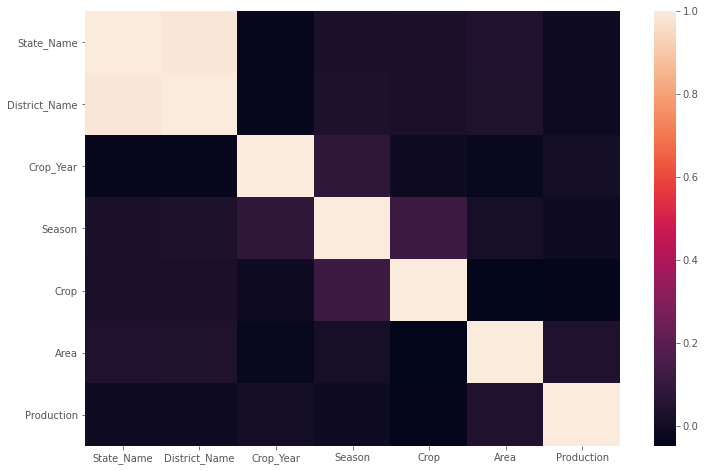

In [45]:
sns.heatmap(data.corr())

In [46]:
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25/Q1' ,'P50/Q2' ,'P75/Q3' ,'P90' ,'P95' ,'P99' ,'MAX'])


In [47]:
data.apply(lambda x: var_summary(x)).T

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25/Q1,P50/Q2,P75/Q3,P90,P95,P99,MAX
State_Name,246091.0,0.0,4.516275e+06,18.352053,17.0,9.905659e+00,9.812208e+01,1.000000e+00,2.0,3.0,4.0,10.0,17.0,28.0,31.0,32.000000,3.300000e+01,3.300000e+01
District_Name,246091.0,0.0,8.032579e+07,326.406841,320.0,1.960745e+02,3.844522e+04,1.000000e+00,6.0,34.0,57.0,139.0,320.0,507.0,592.0,621.000000,6.420000e+02,6.460000e+02
Crop_Year,246091.0,0.0,4.935707e+08,2005.643018,2006.0,4.952164e+00,2.452393e+01,1.997000e+03,1997.0,1998.0,1999.0,2002.0,2006.0,2010.0,2013.0,2013.000000,2.014000e+03,2.015000e+03
Season,246091.0,0.0,6.039090e+05,2.454007,2.0,1.493100e+00,2.229348e+00,1.000000e+00,1.0,1.0,1.0,1.0,2.0,4.0,4.0,5.000000,6.000000e+00,6.000000e+00
Crop,246091.0,0.0,7.010029e+06,28.485516,23.0,2.100263e+01,4.411107e+02,1.000000e+00,2.0,3.0,5.0,15.0,23.0,38.0,65.0,74.000000,8.200000e+01,1.240000e+02
Area,246091.0,0.0,2.953786e+09,12002.820864,582.0,5.052340e+04,2.552614e+09,4.000000e-02,1.0,4.0,12.0,80.0,582.0,4392.0,27100.0,67534.500000,1.892681e+05,8.580100e+06
Production,246091.0,0.0,1.426497e+11,579662.446452,755.0,1.693624e+07,2.868363e+14,-1.440806e+06,0.0,2.0,10.0,87.0,755.0,7610.5,71619.0,234175.550509,1.174027e+06,1.250800e+09


In [ ]:
!pip install -U pandas-profiling

In [48]:
import pandas_profiling

In [49]:
pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [50]:
data1.skew()

State_Name       -0.108782
District_Name    -0.029164
Crop_Year         0.009581
Season            0.565291
Crop              1.144021
Area             48.001278
Production       41.052490
dtype: float64

In [51]:
data.kurtosis()

State_Name         -1.285476
District_Name      -1.288723
Crop_Year          -1.135214
Season             -1.041144
Crop                0.823901
Area             5568.375426
Production       1911.037054
dtype: float64

In [52]:
sd=np.log1p(data.Area)

In [53]:
data['Area']=sd

In [54]:
data.skew()

State_Name       -0.108782
District_Name    -0.029164
Crop_Year         0.009581
Season            0.565291
Crop              1.144021
Area              0.024720
Production       41.052490
dtype: float64

In [63]:
sd1=np.log1p(data['Production']-(min(data.Production)-1))

In [64]:
sd1.isna().sum()

0

In [65]:
data['Production']=sd1

In [66]:
data.skew()

State_Name      -0.108782
District_Name   -0.029164
Crop_Year        0.009581
Season           0.565291
Crop             1.144021
Area             0.024720
Production      -0.088770
dtype: float64

In [ ]:
#sfk=data.skew()
#sfk=sfk[abs(sfk)>.75].index

In [ ]:
#data[sfk]=np.log(data[sfk])

In [ ]:
pandas_profiling.ProfileReport(data)

In [60]:
import statsmodels.formula.api as smf

In [ ]:
#lm1 = smf.ols('Production ~ State_Name + District_Name + Crop_Year + Season + Crop + Area', data).fit() # Ordinary Least Square method : For Regression MOdel

In [67]:
lm = smf.ols('Production ~  Season + Crop + Area', data).fit() # Ordinary Least Square method : For Regression MOdel

In [68]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Production   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                  0.044
Method:                 Least Squares   F-statistic:                     3770.
Date:                Fri, 22 Apr 2022   Prob (F-statistic):               0.00
Time:                        17:49:35   Log-Likelihood:             6.8582e+05
No. Observations:              246091   AIC:                        -1.372e+06
Df Residuals:                  246087   BIC:                        -1.372e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.7391   9.94e-05   2.76e+04      0.000       2.739       2.739
Season        -0.0002   2.03e-05     -7.924      0.000      -0.000      -0.000
Crop       -7.909e-05   1.45e-06    -54.475      0.000   -8.19e-05   -7.62e-05
Area           0.0009   1.08e-05     82.973      0.000       0.001       0.001
==============================================================================
Omnibus:                   150100.971   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):      30928941035.434
Skew:                          -0.653   Prob(JB):                         0.00
Kurtosis:                    1739.761   Cond. No.                         119.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [72]:
lm.rsquared

0.04393521477425599

In [73]:
ltmpredic = lm.predict(data)

In [74]:
from sklearn import metrics
mse = metrics.mean_squared_error( data.Production, ltmpredic )
rmse = np.sqrt( mse )


In [75]:
rmse

0.014908648518793888

In [ ]:
# using sklearn library

In [76]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import QuantileTransformer
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

In [ ]:
data.columns

In [77]:
X_train, X_test, y_train, y_test = train_test_split(
  data[['Season', 'Crop', 'Area']],
  data.Production,
  test_size=0.3,
  random_state = 20 )

In [78]:
linreg = LinearRegression()
linreg.fit( X_train, y_train )


LinearRegression()

In [79]:
y_pred = linreg.predict( X_test )

In [80]:
metrics.r2_score( y_test, y_pred )

0.048174585021885874

In [81]:
mod = LinearRegression()

In [82]:
regr_trans = TransformedTargetRegressor(regressor=mod, transformer=QuantileTransformer(output_distribution='normal'))
regr_trans.fit(X_train, y_train)
yhat = regr_trans.predict(X_test)

In [83]:
round(mean_absolute_error(y_test, yhat), 2)

0.0

In [86]:
round(r2_score(y_test, yhat), 3)

0.049

In [87]:
round(np.sqrt(mean_squared_error(y_test, yhat)),2)

0.01

# AGRICULTURE PROJECT 

In [97]:
data = pd.read_csv('apy.csv')
data.head()

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0


## EDA

In [68]:
data.shape

(242361, 7)

In [110]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 242361 entries, 0 to 246090
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   State_Name     242361 non-null  object 
 1   District_Name  242361 non-null  object 
 2   Crop_Year      242361 non-null  int64  
 3   Season         242361 non-null  object 
 4   Crop           242361 non-null  object 
 5   Area           242361 non-null  float64
 6   Production     242361 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 22.9+ MB


In [111]:
data.describe()

,Crop_Year,Area,Production
count,242361.000000,2.423610e+05,2.423610e+05
mean,2005.625773,1.216741e+04,5.825034e+05
std,4.958285,5.085744e+04,1.706581e+07
min,1997.000000,1.000000e-01,0.000000e+00
25%,2002.000000,8.700000e+01,8.800000e+01
50%,2006.000000,6.030000e+02,7.290000e+02
75%,2010.000000,4.545000e+03,7.023000e+03
max,2015.000000,8.580100e+06,1.250800e+09


In [112]:
data.columns

Index(['State_Name', 'District_Name', 'Crop_Year', 'Season', 'Crop', 'Area',
       'Production'],
      dtype='object')

In [98]:
data.isna().sum()

State_Name          0
District_Name       0
Crop_Year           0
Season              0
Crop                0
Area                0
Production       3730
dtype: int64

In [ ]:
#remove the NAN values from the dataset

In [99]:
data=data.dropna()

In [100]:
data.isna().sum()

State_Name       0
District_Name    0
Crop_Year        0
Season           0
Crop             0
Area             0
Production       0
dtype: int64

In [28]:
data.shape

(242361, 7)

### PLOTTING TOP 5 STATES WITH LARGE AREA

In [107]:
higharea =data.groupby(by='State_Name')['Area'].sum().sort_values(ascending=False).head().reset_index()
higharea.Area

0    4.336223e+08
1    3.297913e+08
2    3.221860e+08
3    2.687882e+08
4    2.154030e+08
Name: Area, dtype: float64

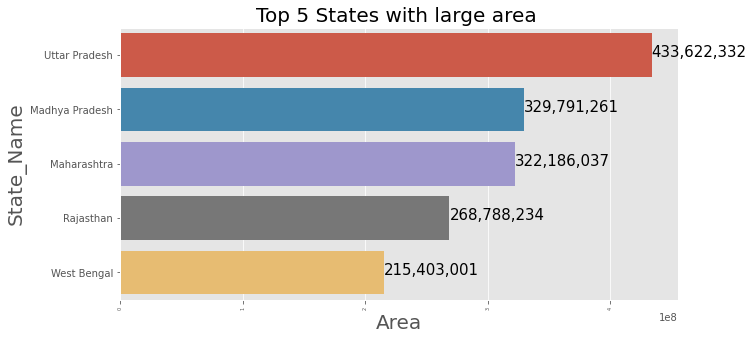

In [126]:
plt.figure(figsize=(10,5))
plt.xticks(rotation=90,fontsize=5)
plt.yticks(fontsize=10)
plt.xlabel('Area',fontsize=20)
plt.ylabel('States',fontsize=20)
plt.title('Top 5 States with large area ',fontsize=20)
pl=sns.barplot(x=higharea.Area, y=higharea.State_Name)
for i, (value,name) in enumerate(zip(higharea.Area,higharea.State_Name)):
  pl.text(value, i-.05, f"{value:,.0f}", size=15,ha='left',va='center')

### PLOTING TOP 5 DISTRICTS WITH LARGE AREA


In [115]:
higharea_D =data.groupby(by='District_Name')['Area'].sum().sort_values(ascending=False).head().reset_index()
higharea_D.Area

0    24234949.0
1    23726486.0
2    22315289.0
3    20694200.0
4    20098474.0
Name: Area, dtype: float64

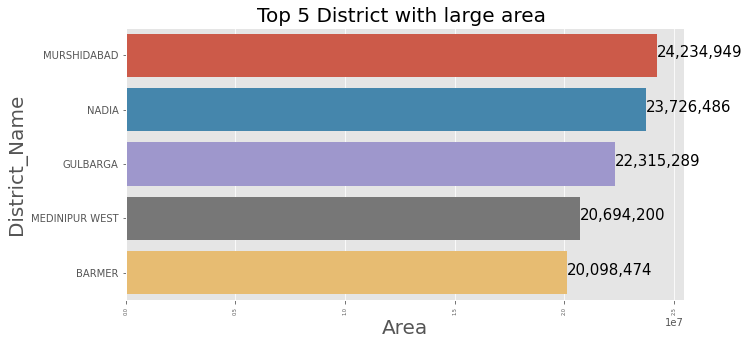

In [125]:
plt.figure(figsize=(10,5))
plt.xticks(rotation=90,fontsize=5)
plt.yticks(fontsize=10)
plt.xlabel('Area',fontsize=20)
plt.ylabel('District',fontsize=20)
plt.title('Top 5 District with large area ',fontsize=20)
pl=sns.barplot(x=higharea_D.Area, y=higharea_D.District_Name)
for i, (value,name) in enumerate(zip(higharea_D.Area,higharea_D.District_Name)):
  pl.text(value, i-.05, f"{value:,.0f}", size=15,ha='left',va='center')


### PLOTTING TOP 5 CROP WITH HIGHEST PRODUCTIONS (1997 - 2015)

In [160]:

highprod=data.groupby(by='Crop')['Production'].sum().sort_values(ascending=False).head().reset_index()
highprod.Production

0    1.299816e+11
1    5.535682e+09
2    1.605470e+09
3    1.332826e+09
4    4.248263e+08
Name: Production, dtype: float64

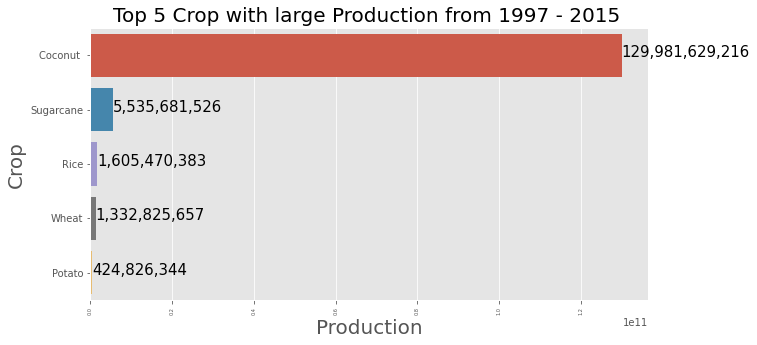

In [167]:
plt.figure(figsize=(10,5))
plt.xticks(rotation=90,fontsize=5)
plt.yticks(fontsize=10)
plt.xlabel('Production',fontsize=20)
plt.ylabel('Crop',fontsize=20)
plt.title('Top 5 Crop with large Production from 1997 - 2015 ',fontsize=20)
pl=sns.barplot(x=highprod.Production, y=highprod.Crop)
for i, (value,name) in enumerate(zip(highprod.Production,highprod.Crop)):
  pl.text(value, i-.05, f"{value:,.0f}", size=15,ha='left',va='center')


### TOP 5 CROPS PRODUCTION IN YEARS ( COCONUT, SUGARCANE, RICE, WHEAT, POTATO )

In [153]:
Coconut = data[data.Crop == 'Coconut ']
Coconut=Coconut.groupby(by='Crop_Year')['Production'].sum().reset_index()
Coconut.head()

,Crop_Year,Production
0,1997,6.344142e+06
1,1998,5.283860e+09
2,1999,5.859817e+09
3,2000,6.880409e+09
4,2001,6.881287e+09


In [154]:
Sugarcane = data[data.Crop == 'Sugarcane']
Sugarcane=Sugarcane.groupby(by='Crop_Year')['Production'].sum().reset_index()
Sugarcane.head()

,Crop_Year,Production
0,1997,501229055.0
1,1998,259809110.0
2,1999,294092445.8
3,2000,296117297.3
4,2001,296512607.1


In [150]:
Rice = data[data.Crop == 'Rice']
Rice=Rice.groupby(by='Crop_Year')['Production'].sum().reset_index()
Rice.head()

,Crop_Year,Production
0,1997,65848504.0
1,1998,78761219.0
2,1999,77917065.6
3,2000,83092698.8
4,2001,90057868.0


In [151]:
Wheat = data[data.Crop == 'Wheat']
Wheat=Wheat.groupby(by='Crop_Year')['Production'].sum().reset_index()
Wheat.head()

,Crop_Year,Production
0,1997,63831633.0
1,1998,69699079.0
2,1999,75068369.0
3,2000,69487129.9
4,2001,72648945.9


In [152]:
Potato = data[data.Crop == 'Potato']
Potato=Potato.groupby(by='Crop_Year')['Production'].sum().reset_index()
Potato.head()

,Crop_Year,Production
0,1997,14095119.0
1,1998,20042976.0
2,1999,21777579.0
3,2000,20332883.9
4,2001,22344741.3


/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:3

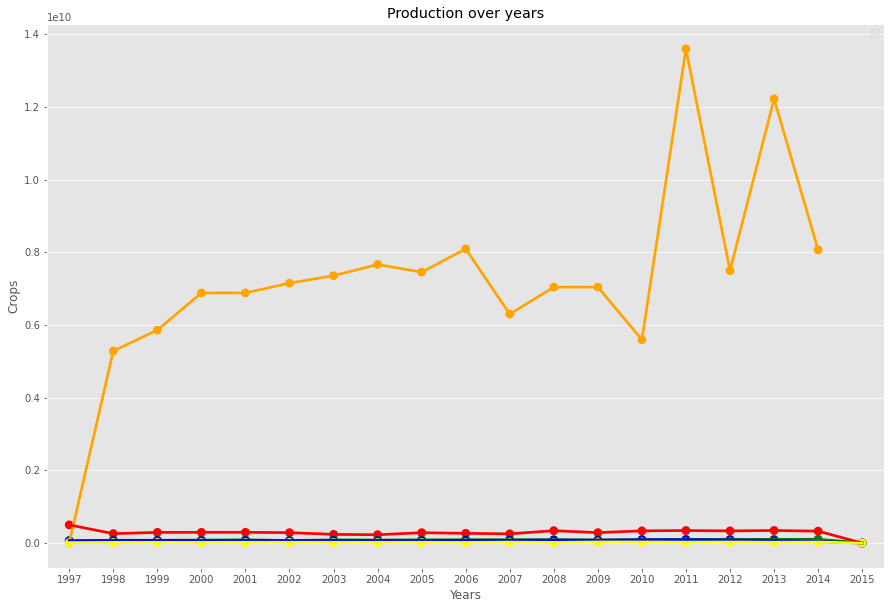

In [158]:
plt.figure(figsize=(15,10))

sns.pointplot(Coconut.Crop_Year,Coconut.Production,color='Orange')
sns.pointplot(Sugarcane.Crop_Year,Sugarcane.Production,color='Red')
sns.pointplot(Rice.Crop_Year,Rice.Production,color='Green')
sns.pointplot(Wheat.Crop_Year,Wheat.Production,color='Blue')
sns.pointplot(Potato.Crop_Year,Potato.Production,color='Yellow')


plt.title('Production over years')
plt.ylabel('Crops')
plt.xlabel('Years')
plt.legend()
plt.show()

In [141]:
data.Crop.unique()

array(['Arecanut', 'Other Kharif pulses', 'Rice', 'Banana', 'Cashewnut',
       'Coconut ', 'Dry ginger', 'Sugarcane', 'Sweet potato', 'Tapioca',
       'Black pepper', 'Dry chillies', 'other oilseeds', 'Turmeric',
       'Maize', 'Moong(Green Gram)', 'Urad', 'Arhar/Tur', 'Groundnut',
       'Sunflower', 'Bajra', 'Castor seed', 'Cotton(lint)', 'Horse-gram',
       'Jowar', 'Korra', 'Ragi', 'Tobacco', 'Gram', 'Wheat', 'Masoor',
       'Sesamum', 'Linseed', 'Safflower', 'Onion', 'other misc. pulses',
       'Samai', 'Small millets', 'Coriander', 'Potato',
       'Other  Rabi pulses', 'Soyabean', 'Beans & Mutter(Vegetable)',
       'Bhindi', 'Brinjal', 'Citrus Fruit', 'Cucumber', 'Grapes', 'Mango',
       'Orange', 'other fibres', 'Other Fresh Fruits', 'Other Vegetables',
       'Papaya', 'Pome Fruit', 'Tomato', 'Mesta', 'Cowpea(Lobia)',
       'Lemon', 'Pome Granet', 'Sapota', 'Cabbage', 'Rapeseed &Mustard',
       'Peas  (vegetable)', 'Niger seed', 'Bottle Gourd', 'Varagu',
       'Garl

In [168]:
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25/Q1' ,'P50/Q2' ,'P75/Q3' ,'P90' ,'P95' ,'P99' ,'MAX'])




In [169]:
data.describe()

,Crop_Year,Area,Production
count,242361.000000,2.423610e+05,2.423610e+05
mean,2005.625773,1.216741e+04,5.825034e+05
std,4.958285,5.085744e+04,1.706581e+07
min,1997.000000,1.000000e-01,0.000000e+00
25%,2002.000000,8.700000e+01,8.800000e+01
50%,2006.000000,6.030000e+02,7.290000e+02
75%,2010.000000,4.545000e+03,7.023000e+03
max,2015.000000,8.580100e+06,1.250800e+09


In [92]:
data.State_Name.unique()

array(['Andaman and Nicobar Islands', 'Andhra Pradesh',
       'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh',
       'Chhattisgarh', 'Dadra and Nagar Haveli', 'Goa', 'Gujarat',
       'Haryana', 'Himachal Pradesh', 'Jammu and Kashmir ', 'Jharkhand',
       'Karnataka', 'Kerala', 'Madhya Pradesh', 'Maharashtra', 'Manipur',
       'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Puducherry',
       'Punjab', 'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Telangana ',
       'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal'],
      dtype=object)

### HOT ENCODING 

In [171]:
S_N=data.State_Name.unique()
data.State_Name.replace(to_replace=S_N,value=[i for i in range(1,len(S_N)+1)], inplace=True)

S_N1=data.District_Name.unique()
data.District_Name.replace(to_replace=S_N1,value=[i for i in range(1,len(S_N1)+1)], inplace=True)

S_N2=data.Season.unique()
data.Season.replace(to_replace=S_N2,value=[i for i in range(1,len(S_N2)+1)], inplace=True)

S_N3=data.Crop.unique()
data.Crop.replace(to_replace=S_N3,value=[i for i in range(1,len(S_N3)+1)], inplace=True)

data.head()


,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,1,1,2000,1,1,1254.0,2000.0
1,1,1,2000,1,2,2.0,1.0
2,1,1,2000,1,3,102.0,321.0
3,1,1,2000,2,4,176.0,641.0
4,1,1,2000,2,5,720.0,165.0


In [172]:
data.corr() 

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
State_Name,1.000000,0.984783,-0.026002,0.028104,0.026915,0.039070,-0.009502
District_Name,0.984783,1.000000,-0.025140,0.030453,0.027732,0.037861,-0.010558
Crop_Year,-0.026002,-0.025140,1.000000,0.084894,-0.010426,-0.025305,0.006989
Season,0.028104,0.030453,0.084894,1.000000,0.121942,0.015561,-0.010119
Crop,0.026915,0.027732,-0.010426,0.121942,1.000000,-0.047481,-0.035008
Area,0.039070,0.037861,-0.025305,0.015561,-0.047481,1.000000,0.040587
Production,-0.009502,-0.010558,0.006989,-0.010119,-0.035008,0.040587,1.000000


<AxesSubplot:>

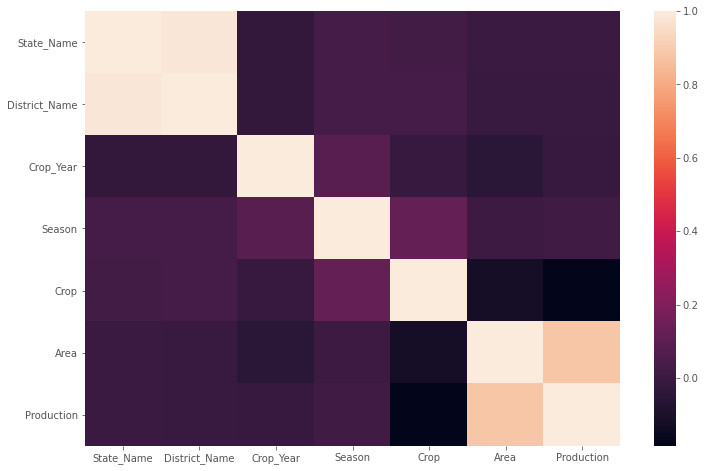

In [201]:
sns.heatmap(data.corr())

In [207]:
pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [173]:
data.skew()

State_Name       -0.116849
District_Name    -0.037468
Crop_Year         0.015877
Season            0.559086
Crop              1.140256
Area             47.769121
Production       40.741540
dtype: float64

In [174]:
data.kurtosis()

State_Name         -1.286684
District_Name      -1.289752
Crop_Year          -1.138114
Season             -1.049446
Crop                0.735931
Area             5506.287221
Production       1882.113472
dtype: float64

### LOG TRANSFORMATION TO REDUCE THE SKEWNESS ON AREA,PRODUCTION

In [175]:
sd=np.log1p(data.Area)

In [176]:
data.Area=sd

In [177]:
data.skew()

State_Name       -0.116849
District_Name    -0.037468
Crop_Year         0.015877
Season            0.559086
Crop              1.140256
Area              0.026965
Production       40.741540
dtype: float64

In [182]:
sd1=np.log1p(data['Production']-(min(data.Production)-1))

In [183]:
data.Production=sd1

In [184]:
data.skew()

State_Name      -0.116849
District_Name   -0.037468
Crop_Year        0.015877
Season           0.559086
Crop             1.140256
Area             0.026965
Production       0.251170
dtype: float64

### BUILDING A LINEAR REGRESSION MODEL WITH SKLEARN PACKAGE

In [185]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [186]:
# SPLITING THE DATA SENT 

X_train, X_test, y_train, y_test = train_test_split(
  data[['Season', 'Crop', 'Area']],
  data.Production,
  test_size=0.3,
  random_state = 20 )

In [187]:
# BUILDING LINEAR REGRESSION MODEL

linreg = LinearRegression()
linreg.fit( X_train, y_train )

LinearRegression()

In [188]:
# PREDICTING THE VALUES
y_pred = linreg.predict( X_test )

### MODEL EVALUATION

In [189]:
import sklearn.metrics as metrics
from sklearn.metrics import mean_absolute_percentage_error

In [190]:
# MODEL EVALUATION

metrics.r2_score( y_test, y_pred )

0.7817668878467434

In [191]:
print(mean_absolute_percentage_error( y_test, y_pred ))


0.24600175159734775


### BUILDING OLS MODEL

In [192]:
import statsmodels.formula.api as smf

In [193]:
lm = smf.ols('Production ~   Season + Crop + Area', data).fit() # Ordinary Least Square method : For Regression MOdel

In [195]:
ltmpredic = lm.predict(data)

### MODEL EVALUATION OLS MODEL

In [194]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Production   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.782
Method:                 Least Squares   F-statistic:                 2.891e+05
Date:                Sat, 23 Apr 2022   Prob (F-statistic):               0.00
Time:                        16:38:26   Log-Likelihood:            -4.3795e+05
No. Observations:              242361   AIC:                         8.759e+05
Df Residuals:                  242357   BIC:                         8.759e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6090      0.010     61.020      0.000       0.589       0.629
Season         0.0367      0.002     18.186      0.000       0.033       0.041
Crop          -0.0126      0.000    -87.847      0.000      -0.013      -0.012
Area           0.9901      0.001    909.673      0.000       0.988       0.992
==============================================================================
Omnibus:                    55894.356   Durbin-Watson:                   1.713
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           273392.537
Skew:                           1.038   Prob(JB):                         0.00
Kurtosis:                       7.771   Cond. No.                         121.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [196]:
from sklearn import metrics
mse = metrics.mean_squared_error( data.Production, ltmpredic )
rmse = np.sqrt( mse )

In [197]:
rmse

1.4741284761577822

In [198]:
from sklearn.metrics import mean_absolute_percentage_error

In [199]:
print(mean_absolute_percentage_error(data.Production, ltmpredic))

0.24504172092021476


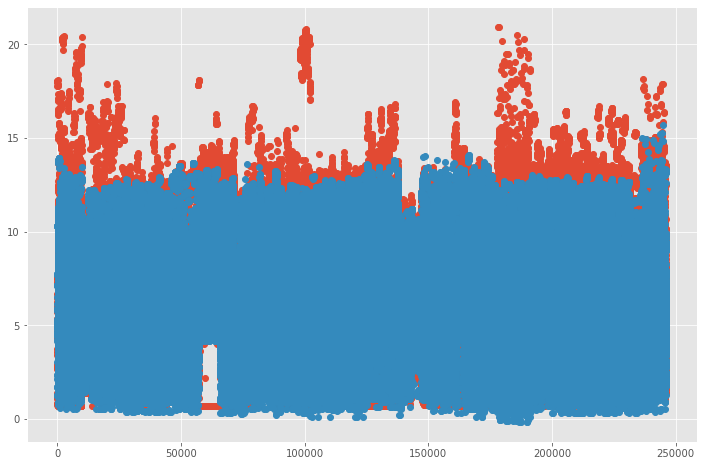

In [200]:
plt.plot(data.Production,marker='o',linestyle='')
plt.plot(ltmpredic,marker='o',linestyle='')